In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

#from scipy import stats
from scipy.stats import jarque_bera, normaltest
import matplotlib.pyplot as plt

import warnings

#warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/glass/glass.csv


### Will explore different visualization and clustering techniques.
Load the dataset.

In [2]:
raw = pd.read_csv('/kaggle/input/glass/glass.csv')
raw.head()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.0,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.0,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.0,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.0,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.0,0.0,1


In [3]:
raw.describe()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000
mean,1.518365,13.407850,2.684533,1.444907,72.650935,0.497056,8.956963,0.175047,0.057009,2.780374
std,0.003037,0.816604,1.442408,0.499270,0.774546,0.652192,1.423153,0.497219,0.097439,2.103739
min,1.511150,10.730000,0.000000,0.290000,69.810000,0.000000,5.430000,0.000000,0.000000,1.000000
25%,1.516523,12.907500,2.115000,1.190000,72.280000,0.122500,8.240000,0.000000,0.000000,1.000000
50%,1.517680,13.300000,3.480000,1.360000,72.790000,0.555000,8.600000,0.000000,0.000000,2.000000
75%,1.519157,13.825000,3.600000,1.630000,73.087500,0.610000,9.172500,0.000000,0.100000,3.000000
max,1.533930,17.380000,4.490000,3.500000,75.410000,6.210000,16.190000,3.150000,0.510000,7.000000


In [4]:
raw.dtypes

RI      float64
Na      float64
Mg      float64
Al      float64
Si      float64
K       float64
Ca      float64
Ba      float64
Fe      float64
Type      int64
dtype: object

# 0. Pre-processing

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

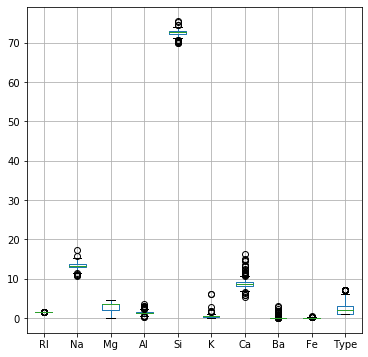

In [6]:
raw.boxplot(figsize=(6,6))

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  This is separate from the ipykernel package so we can avoid doing imports until


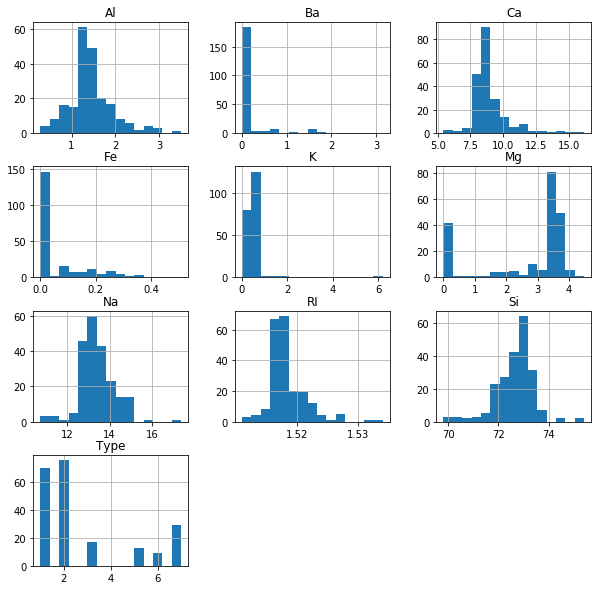

In [7]:
fig = plt.figure(figsize = (10,10))
ax = fig.gca()
raw.hist(ax=ax, bins=15);

Get a count of the outputs.

In [8]:
raw['Type'].value_counts()

2    76
1    70
7    29
3    17
5    13
6     9
Name: Type, dtype: int64

In [9]:
with0 = ['Ba', 'Fe','K','Mg']

In [10]:
Ba0 = raw['Ba'][raw['Ba'] ==0].shape[0]
print('{} Ba values out of {} are 0'.format(Ba0,raw.shape[0]))
Fe0 = raw['Fe'][raw['Fe'] ==0].shape[0]
print('{} Fe values out of {} are 0'.format(Ba0,raw.shape[0]))

176 Ba values out of 214 are 0
176 Fe values out of 214 are 0


Ba and Fe have many values at 0, will leave as is

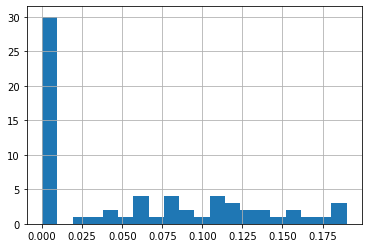

In [11]:
raw['K'][raw['K']<0.2].hist(bins=20);

for transformations, move 0 K values to 0.01

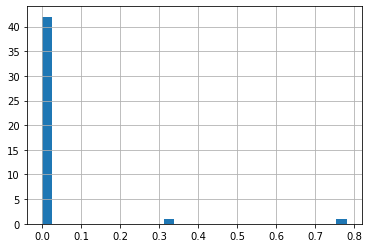

In [12]:
raw['Mg'][raw['Mg']<1].hist(bins=30);

for transformation, move 0 Mg values to 0.2

### Make a dataset with features transformed via Box-Cox

In [13]:
# Box-Cox transformation
from scipy.stats import boxcox

raw_tr = raw.copy()

# min of zero may/will cause issues
#   adjust zeros to non-zero values
for column, value in [('K', 0.01), ('Mg', 0.2)]:
  for index in np.where(raw[column] <0.01):
    print('row {} modified {} to {}'.format(index,column,value) )
    raw_tr[column][index] = value

# run transformations
#   also dropping RI since transformation lowered its dynamic range
for score in raw_tr.drop(['Type','Ba','Fe','RI'],axis=1).columns:
  print('\n',score)
  score_boxcox,_ = boxcox(raw_tr[score])
  raw_tr[score] = score_boxcox
    
  jb_stats = jarque_bera(score_boxcox)
  norm_stats = normaltest(score_boxcox)
  print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
  print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

row [ 63 109 110 111 151 176 177 178 179 180 181 182 183 184 190 191 193 194
 197 200 202 203 204 205 206 208 210 211 212 213] modified K to 0.01
row [105 106 107 108 109 110 111 112 131 167 168 169 170 171 172 173 182 183
 184 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207
 208 209 210 211 212 213] modified Mg to 0.2

 Na
Jarque-Bera test statistics is 57.86228061951298 and p value is 2.724487302430134e-13
Normality test statistics is 17.2239164070407 and p value is 0.00018191733024202367

 Mg
Jarque-Bera test statistics is 40.94093469421457 and p value is 1.287623785373171e-09
Normality test statistics is 36.03308469312802 and p value is 1.498011253457676e-08

 Al
Jarque-Bera test statistics is 13.219381862774496 and p value is 0.0013472484772896198
Normality test statistics is 7.618375571970153 and p value is 0.022166175325853396

 Si
Jarque-Bera test statistics is 104.51266324372389 and p value is 0.0
Normality test statistics is 23.398886834593913 and p value 

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


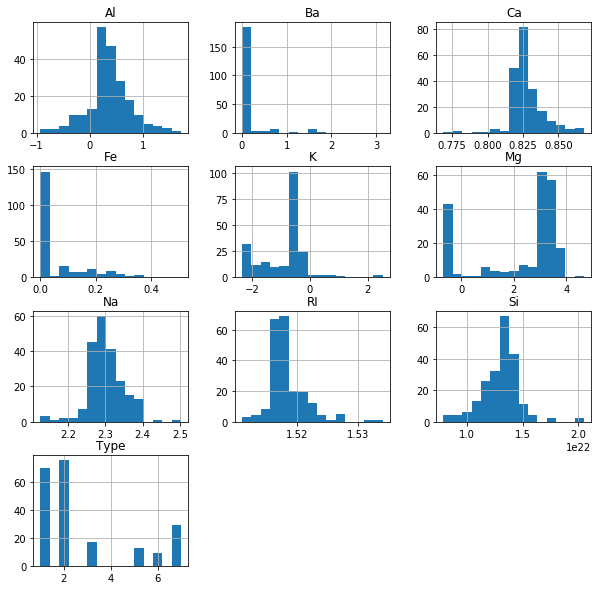

In [14]:
# after Box-Cox
fig = plt.figure(figsize = (10,10))
ax = fig.gca()
raw_tr.hist(ax=ax, bins=15);

Will only look at the 3 outputs with the highest counts.

In [15]:
bools = raw_tr['Type'].isin([1,2,7])
raw= raw_tr[bools].reset_index()

Change output 7 to output 3 so that outputs are 1, 2, or 3

In [16]:
raw['Type'] = raw['Type'].replace(7,3)
raw['Type'].value_counts()

2    76
1    70
3    29
Name: Type, dtype: int64

# 1. Visualization (dimensionality reduction)

In [17]:
# normalize the features
from sklearn import preprocessing

# separate target variable
X_raw = raw.drop(['Type'], axis=1)
Y = raw['Type']

# Get column names first
names = X_raw.columns

# Create the Scaler object
scaler = preprocessing.StandardScaler()

# Fit data on the scaler object
X = scaler.fit_transform(X_raw)
X = pd.DataFrame(X, columns=names)

In [18]:
X.describe()

,index,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
count,1.750000e+02,1.750000e+02,1.750000e+02,1.750000e+02,1.750000e+02,1.750000e+02,1.750000e+02,1.750000e+02,1.750000e+02,1.750000e+02
mean,7.739841e-17,-9.959842e-14,-5.383630e-15,-4.745410e-16,-6.090366e-17,-1.318311e-15,4.415516e-16,-1.428928e-14,2.537653e-16,1.852486e-16
std,1.002869e+00,1.002869e+00,1.002869e+00,1.002869e+00,1.002869e+00,1.002869e+00,1.002869e+00,1.002869e+00,1.002869e+00,1.002869e+00
min,-1.535305e+00,-2.292008e+00,-3.852963e+00,-1.966538e+00,-3.346020e+00,-3.394102e+00,-2.019288e+00,-4.906489e+00,-3.830719e-01,-6.411773e-01
25%,-8.207346e-01,-6.116184e-01,-6.311081e-01,-1.119135e-01,-4.698643e-01,-5.419468e-01,-7.370521e-01,-4.711614e-01,-3.830719e-01,-6.411773e-01
50%,-1.061647e-01,-2.581071e-01,-1.442415e-01,4.827022e-01,-8.982776e-02,2.124401e-01,4.995437e-01,-1.346849e-01,-3.830719e-01,-6.411773e-01
75%,6.084053e-01,1.745004e-01,5.497615e-01,5.908581e-01,4.736664e-01,5.942140e-01,5.981149e-01,2.909755e-01,-3.830719e-01,5.410701e-01
max,1.963624e+00,5.010665e+00,2.883356e+00,1.446831e+00,2.667618e+00,4.418030e+00,2.848885e+00,3.587320e+00,5.672803e+00,3.120519e+00


In [19]:
# graphing function
def graph(data, size, title=None):
    plt.figure(figsize=(10,5))
    colors = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
    colors = ["r","b","g","c","m","y","k","r"]
    for i in range(data.shape[0]):
        plt.text(data[i, 0], data[i, 1], str(Y[i]),
                 color=colors[int(Y[i])],
                 fontdict={'weight': 'bold', 'size': size}
            )

    plt.xticks([])
    plt.yticks([])
    if title:
        plt.title(title, fontdict = {'fontsize' : size} )
    plt.axis('off')
    plt.show()

# PCA

In [20]:
# run PCA
from sklearn.decomposition import PCA

# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X)

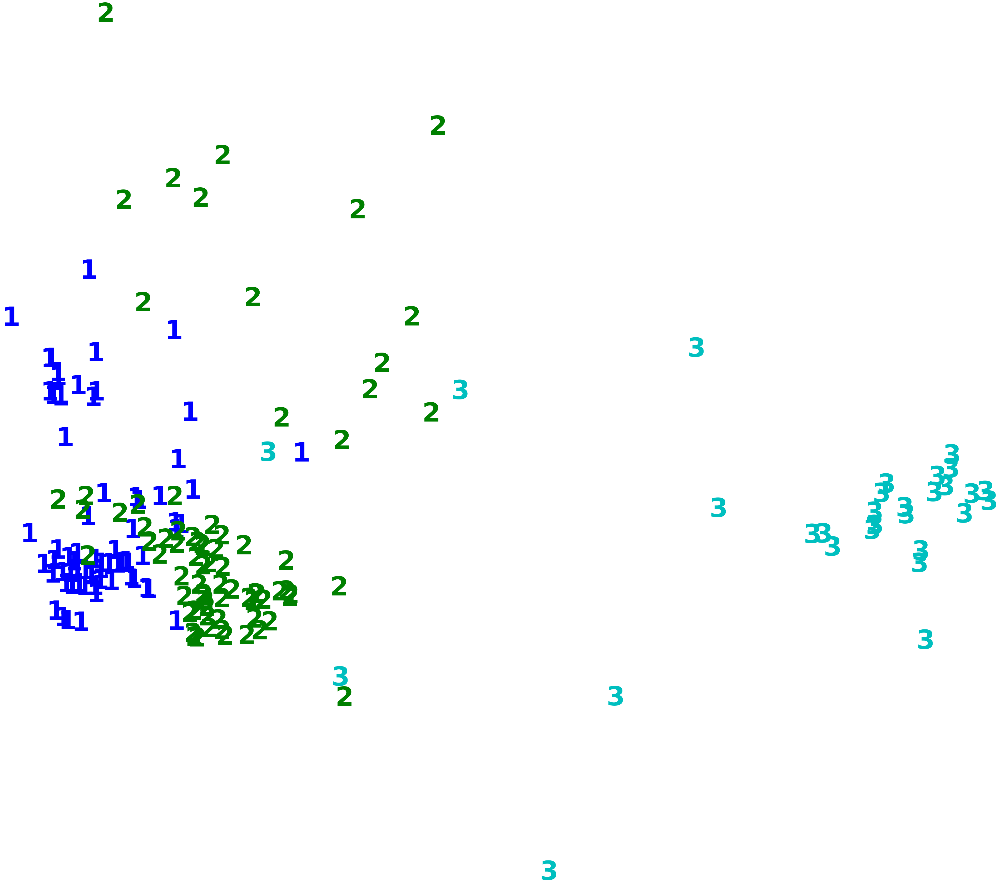

In [21]:
plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
colors = ["r","b","g","c","m","y","k","r"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(Y[i]),
             color=colors[int(Y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

For PCA, glass type 3 is more or less isolated but types 1 & 2 would be difficult to separate if the target variable was absent.

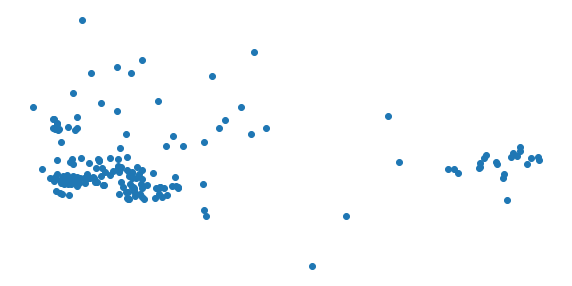

In [22]:
plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# t-SNE

In [23]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 175 samples in 0.000s...
[t-SNE] Computed neighbors for 175 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 175 / 175
[t-SNE] Mean sigma: 1.039845
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.507290
[t-SNE] KL divergence after 300 iterations: 0.344746


In [24]:
print('perplexity = 30')
graph(tsne_results,150)

perplexity = 30


In [25]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 175 samples in 0.000s...
[t-SNE] Computed neighbors for 175 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 175 / 175
[t-SNE] Mean sigma: 1.175942
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.629440
[t-SNE] KL divergence after 300 iterations: 0.433226


In [26]:
print('perplexity = 40')
graph(tsne_results,150)

perplexity = 40


In [27]:
tsne = TSNE(n_components=2, verbose=1, perplexity=70, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 174 nearest neighbors...
[t-SNE] Indexed 175 samples in 0.000s...
[t-SNE] Computed neighbors for 175 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 175 / 175
[t-SNE] Mean sigma: 1.608348
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.931320
[t-SNE] KL divergence after 300 iterations: 0.166471


perplexity = 70


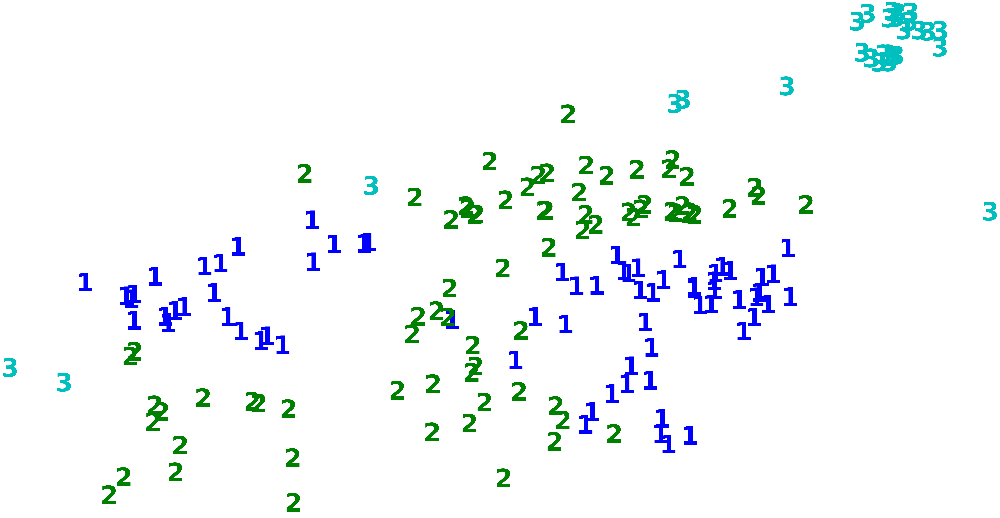

In [28]:
print('perplexity = 70')
graph(tsne_results,150)

In [29]:
tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 174 nearest neighbors...
[t-SNE] Indexed 175 samples in 0.000s...
[t-SNE] Computed neighbors for 175 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 175 / 175
[t-SNE] Mean sigma: 2.209854
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.929977
[t-SNE] KL divergence after 300 iterations: 0.110555


perplexity = 100


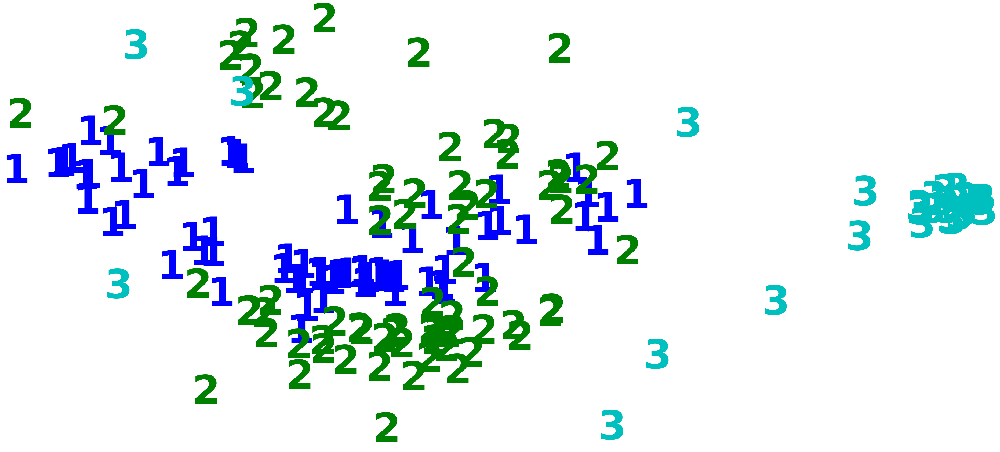

In [30]:
print('perplexity = 100')
graph(tsne_results,150)

In [31]:
tsne = TSNE(n_components=2, verbose=1, perplexity=150, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 174 nearest neighbors...
[t-SNE] Indexed 175 samples in 0.000s...
[t-SNE] Computed neighbors for 175 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 175 / 175
[t-SNE] Mean sigma: 4.217852
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.636929
[t-SNE] KL divergence after 300 iterations: 0.023278


perplexity = 150


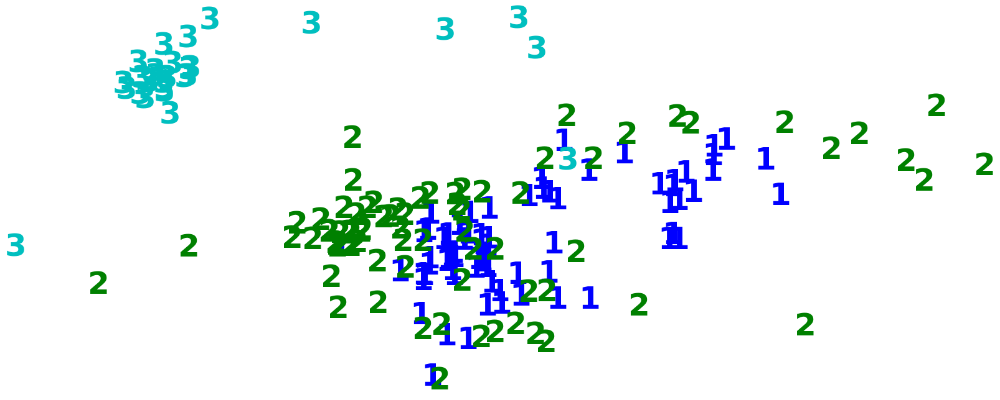

In [32]:
print('perplexity = 150')
graph(tsne_results,50)

In [33]:
tsne = TSNE(n_components=2, verbose=1, perplexity=200, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 174 nearest neighbors...
[t-SNE] Indexed 175 samples in 0.001s...
[t-SNE] Computed neighbors for 175 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 175 / 175
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 38.479443
[t-SNE] KL divergence after 300 iterations: 0.000181


perplexity = 200


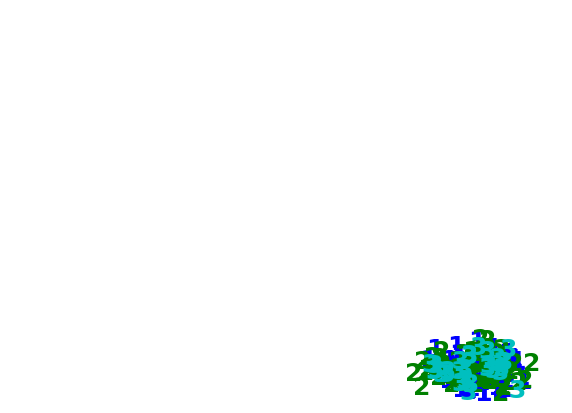

In [34]:
print('perplexity = 200')
graph(tsne_results,25)

In [35]:
tsne = TSNE(n_components=2, verbose=1, perplexity=250, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 174 nearest neighbors...
[t-SNE] Indexed 175 samples in 0.001s...
[t-SNE] Computed neighbors for 175 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 175 / 175
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 40.734558
[t-SNE] KL divergence after 300 iterations: 0.000271


perplexity = 250


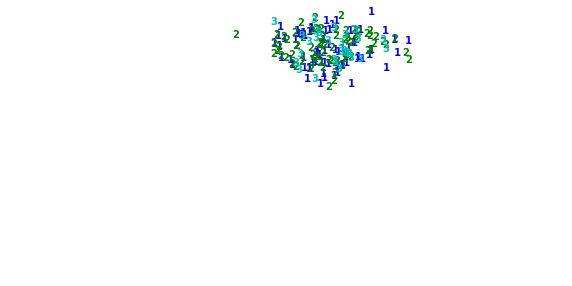

In [36]:
print('perplexity = 250')
graph(tsne_results,10)

In [37]:
tsne = TSNE(n_components=2, verbose=1, perplexity=300, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 174 nearest neighbors...
[t-SNE] Indexed 175 samples in 0.000s...
[t-SNE] Computed neighbors for 175 samples in 0.032s...
[t-SNE] Computed conditional probabilities for sample 175 / 175
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 40.243172
[t-SNE] KL divergence after 300 iterations: 0.000313


perplexity = 300


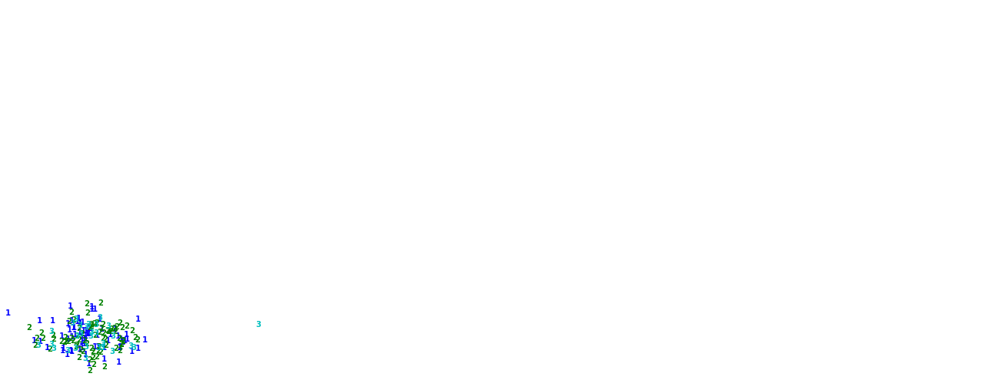

In [38]:
print('perplexity = 300')
graph(tsne_results,10)

# UMAP

In [39]:
import umap

In [40]:
def model(n_neighbors, min_dist):
  print('n_neighors = {}, min_dist = {}'.format(n_neighbors, min_dist))
#  title = 'n_neighors = {}, min_dist = {}'.format(n_neighbors, min_dist)
  umap_results = umap.UMAP(n_neighbors=n_neighbors,
                        min_dist=min_dist,
                        metric='correlation').fit_transform(X)
  graph(umap_results,200)
#  return umap_results

# **Vary n_neighbors**

In [41]:
min_dist = 0.6

In [42]:
model(3, min_dist)

n_neighors = 3, min_dist = 0.6


/opt/conda/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 6 separate connected components using meta-embedding (experimental)
  n_components


In [43]:
model(4, min_dist)

n_neighors = 4, min_dist = 0.6


/opt/conda/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


In [44]:
model(6, min_dist)

n_neighors = 6, min_dist = 0.6


n_neighors = 7, min_dist = 0.6


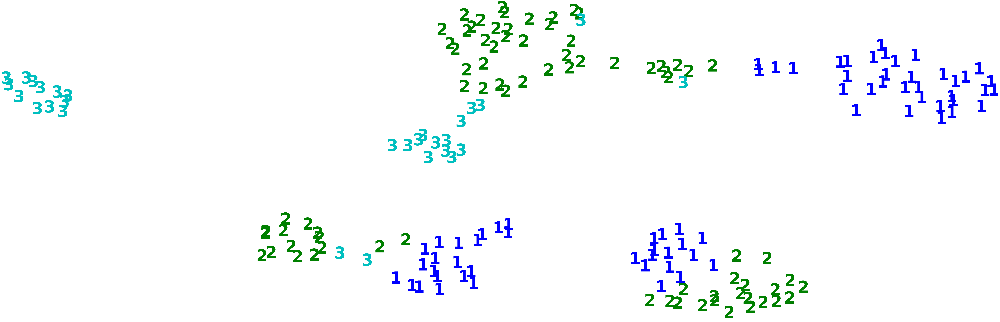

In [45]:
model(7, min_dist)

n_neighors = 8, min_dist = 0.6


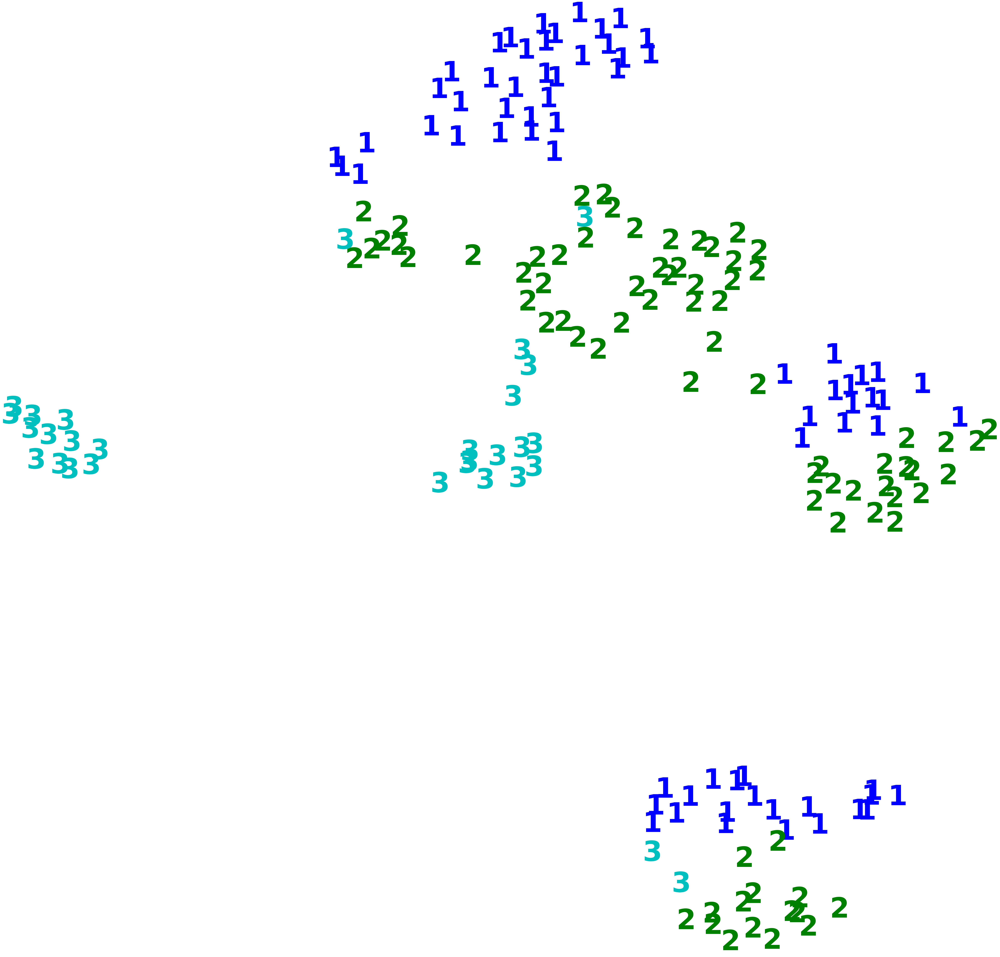

In [46]:
model(8, min_dist)

n_neighors = 9, min_dist = 0.6


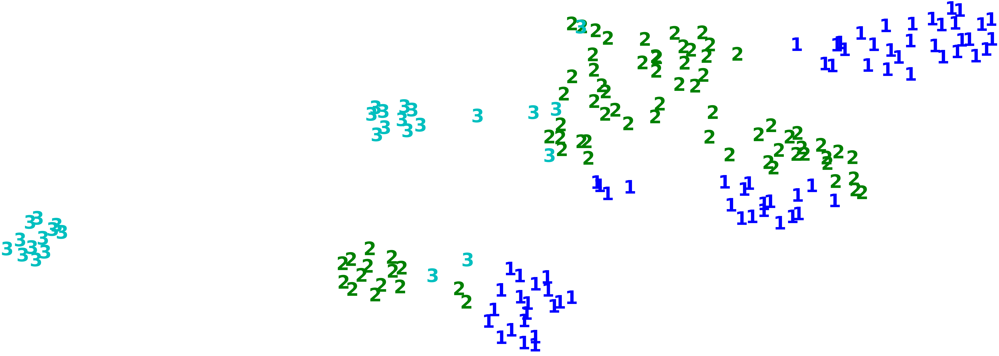

In [47]:
model(9, min_dist)

n_neighors = 10, min_dist = 0.6


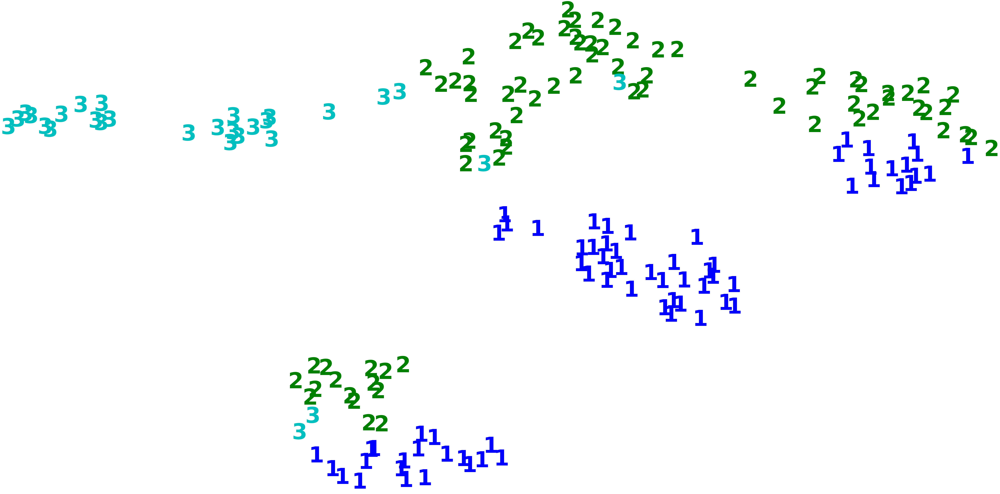

In [48]:
model(10, min_dist)

n_neighors = 11, min_dist = 0.6


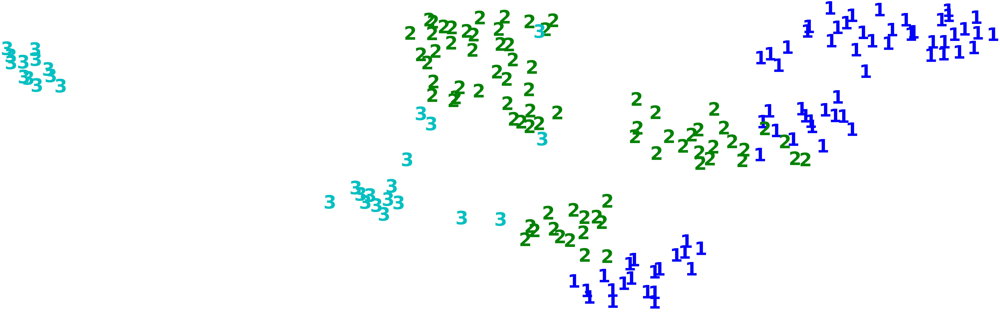

In [49]:
model(11, min_dist)

n_neighors = 12, min_dist = 0.6


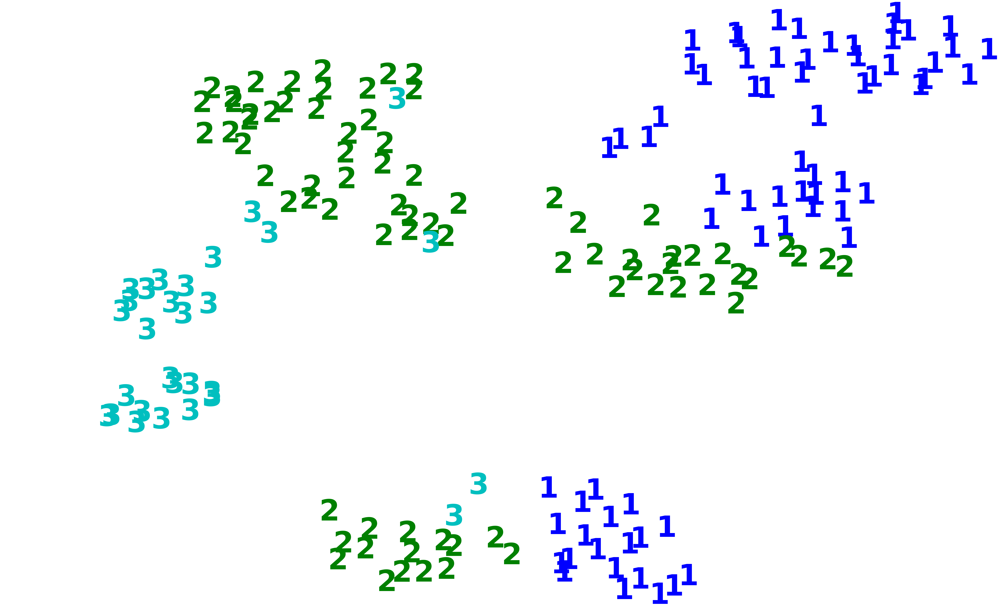

In [50]:
model(12, min_dist)

n_neighors = 13, min_dist = 0.6


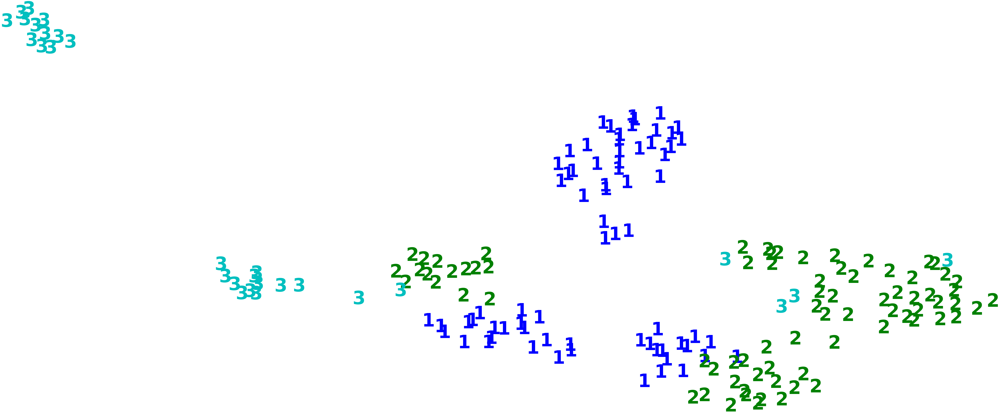

In [51]:
model(13, min_dist)

# Vary min_distance

In [52]:
n_neighors = 10

n_neighors = 10, min_dist = 0.1


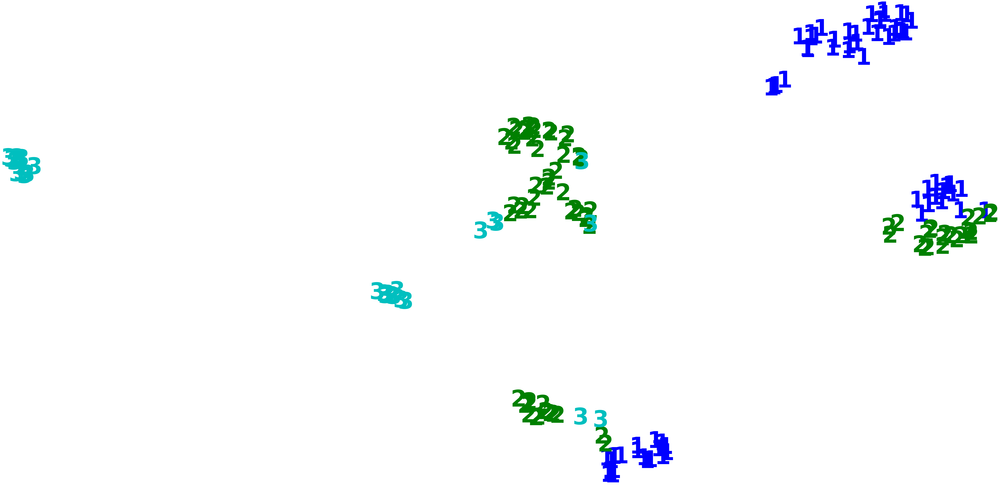

In [53]:
model(n_neighors, 0.1)

n_neighors = 10, min_dist = 0.2


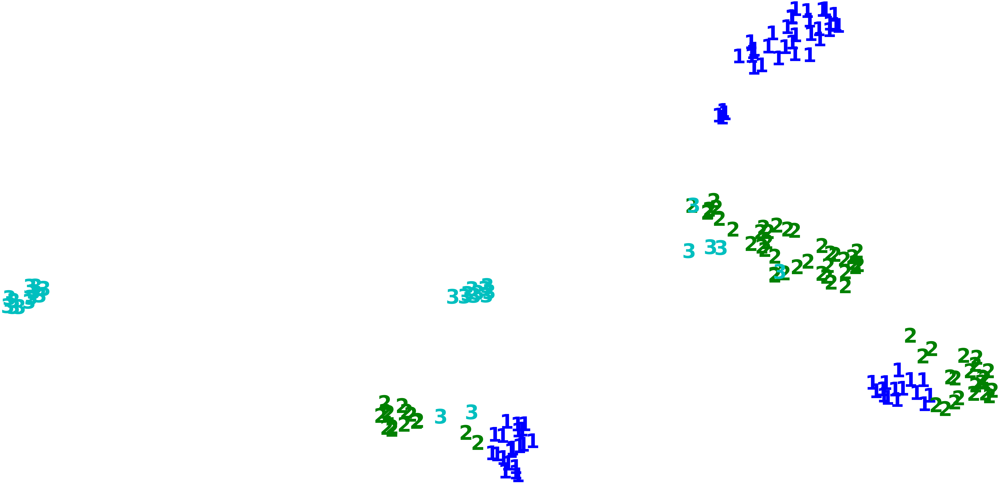

In [54]:
model(n_neighors, 0.2)

In [55]:
model(n_neighors, 0.4)

n_neighors = 10, min_dist = 0.4


n_neighors = 10, min_dist = 0.5


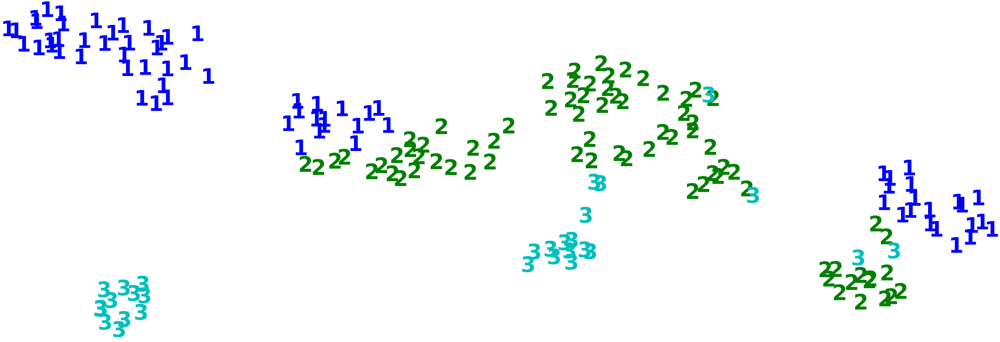

In [56]:
model(n_neighors, 0.5)

n_neighors = 10, min_dist = 0.6


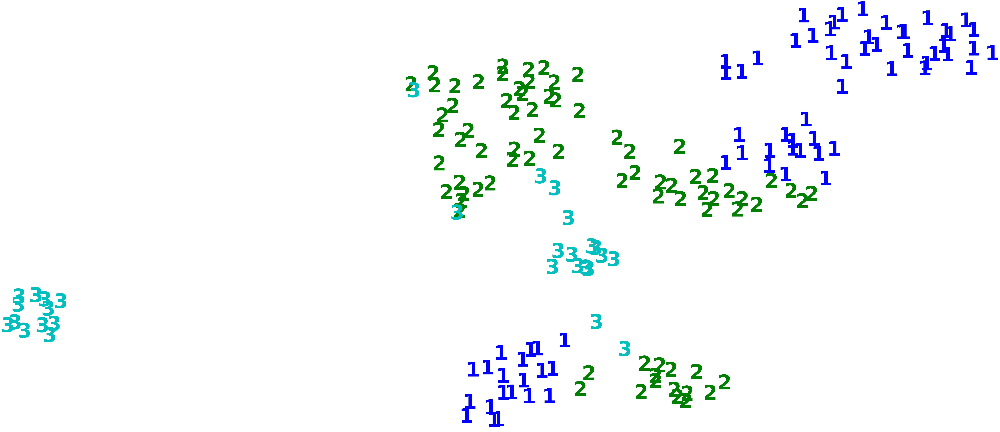

In [57]:
model(n_neighors, 0.6)

In [58]:
model(n_neighors, 0.7)

n_neighors = 10, min_dist = 0.7


## For both t-SNE and UMAP, although there are solutions that separate type3 from type1&2, there is no solution that separates all 3 classes adequately.  This indicates that type1&2 are somehow linearly related.

## The best performing visualization is t-SNE with perplexity of 40.

# 2. Clustering

## K-means

In [59]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn import datasets, metrics

Fit k-means with k values from 2 - 6

In [60]:
# Defining the k-means

cluster_numbers = [2, 3, 4, 5, 6]
kmeans_clusters = []
for i in cluster_numbers:
    k_means = KMeans(n_clusters=i, random_state=123)
    kmeans_clusters.append(k_means.fit_predict(X))

Visualize each k-means solution

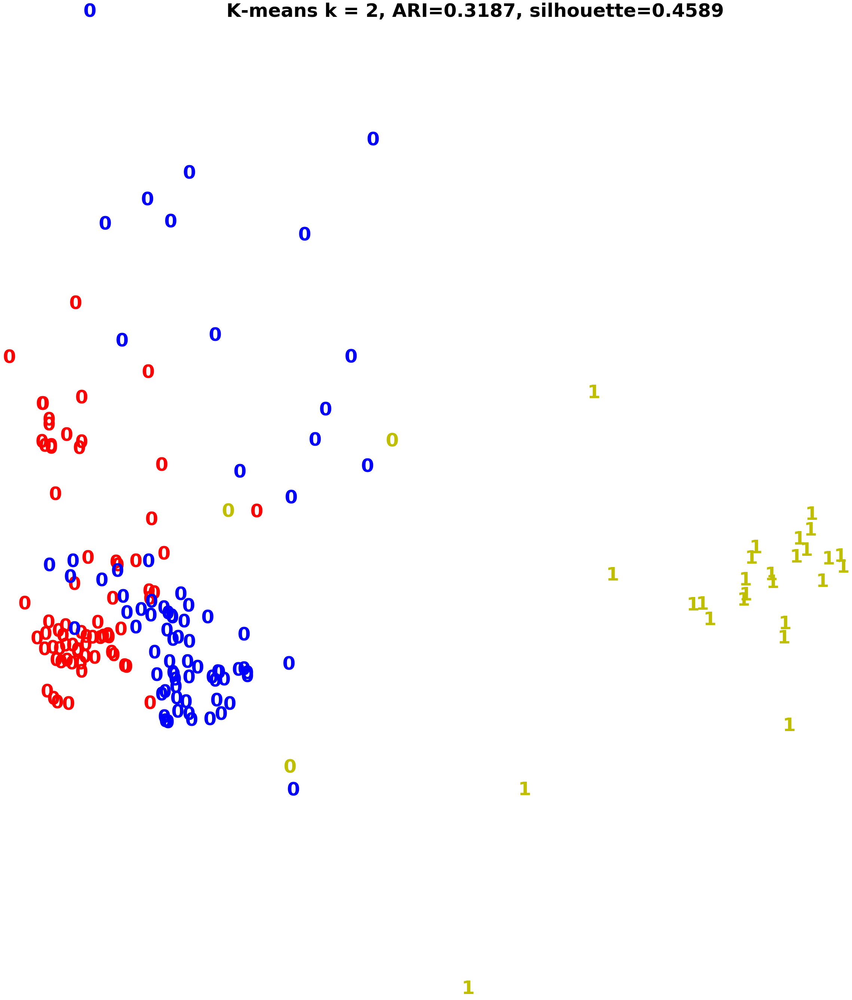

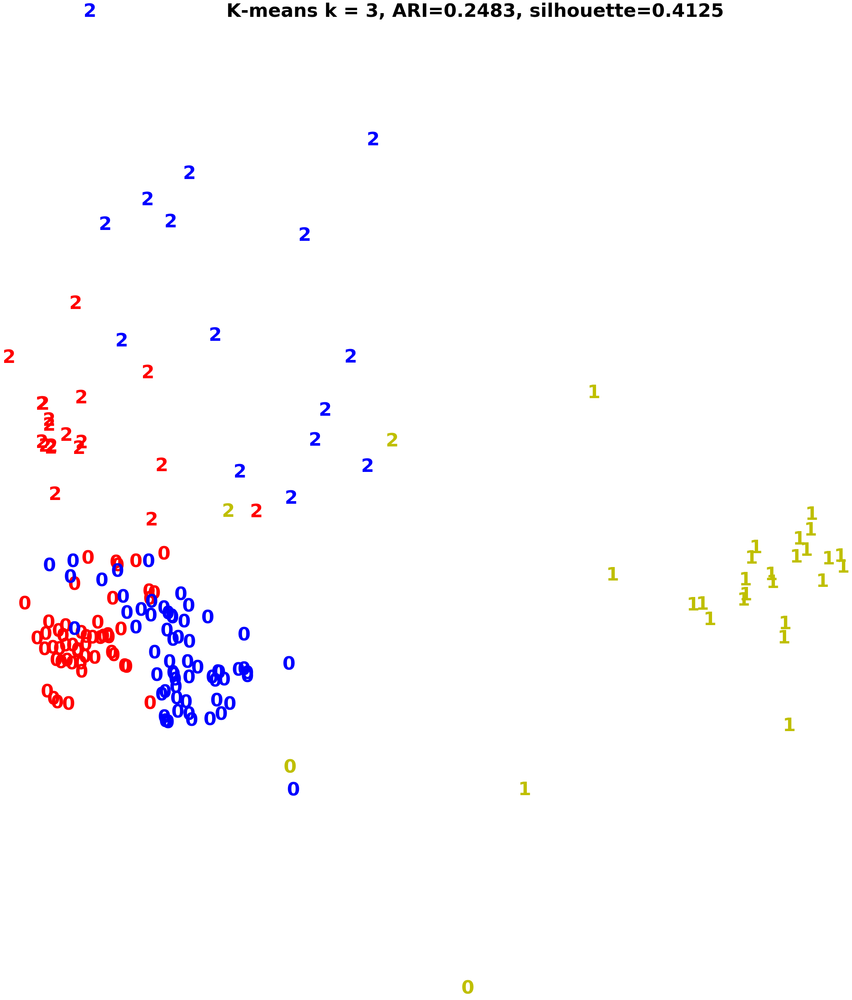

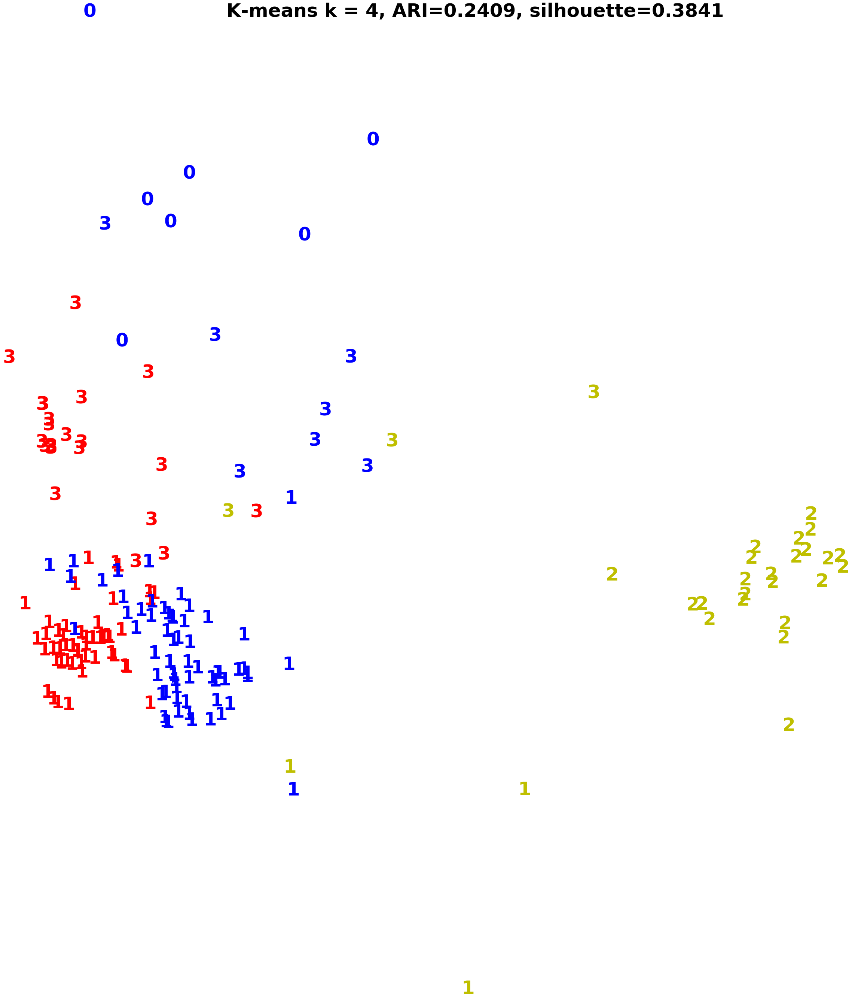

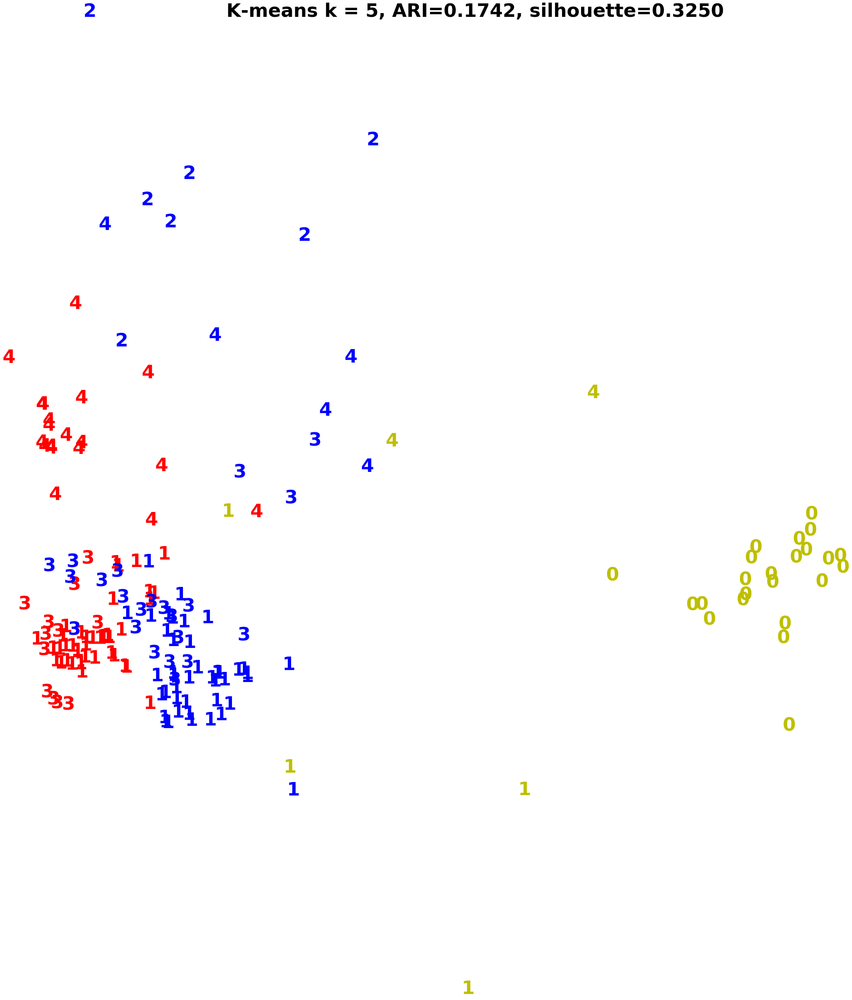

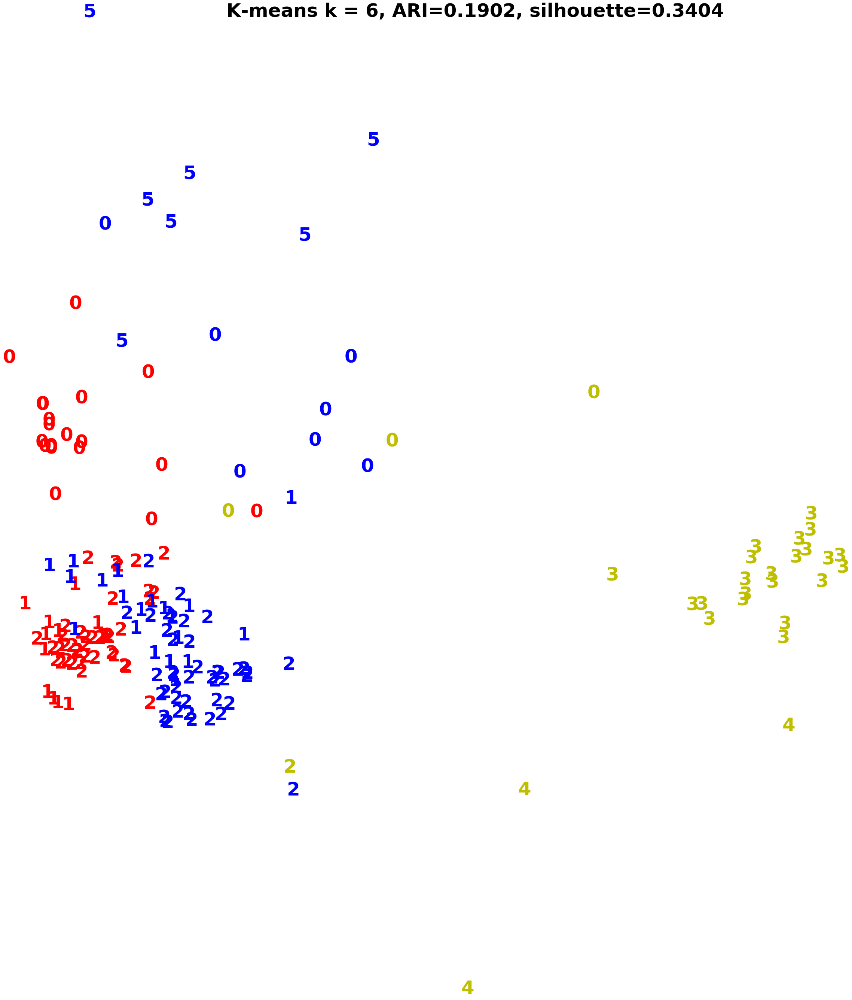

In [61]:
X_pca = PCA(n_components=2).fit_transform(X)

colors = ["k","r","b","y","c","m","g","k","r"]
for i, predictions in enumerate(kmeans_clusters):
#    plt.figure(figsize=(10,5))
    title = "K-means k = {}, ARI={:.4f}, silhouette={:.4f}".format(cluster_numbers[i], 
                metrics.adjusted_rand_score(Y, predictions), metrics.silhouette_score(X, predictions, metric='euclidean'))
    plt.text(np.mean(X_pca[:,0]), np.max(X_pca[:, 1]), title,
                 fontdict={'weight': 'bold', 'size': 50})
    for i in range(X_pca.shape[0]):
        plt.text(X_pca[i, 0], X_pca[i, 1], str(predictions[i]),
                 color=colors[Y[i]],
                 fontdict={'weight': 'bold', 'size': 50}
            )

    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()



### K-means k=3 gives an ARI=0.2483 and a silhouette=0.4125

### Hierarchical clustering

In [62]:
from scipy.cluster.hierarchy import dendrogram, linkage

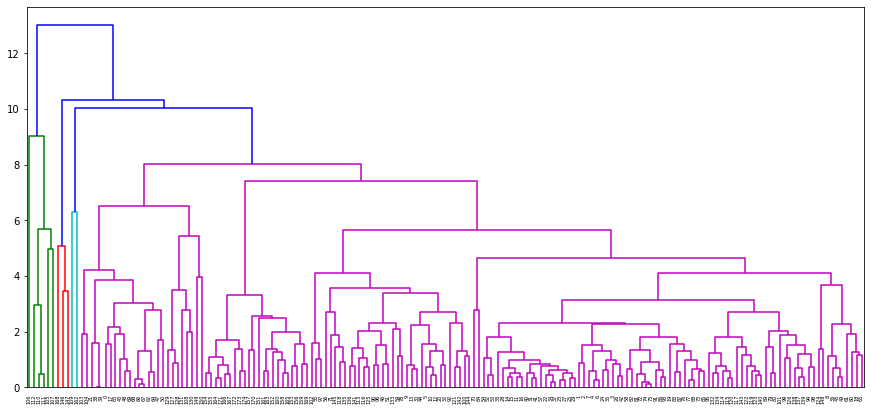

In [63]:
plt.figure(figsize=(15,7))
dendrogram(linkage(X, method='complete'))
plt.show()

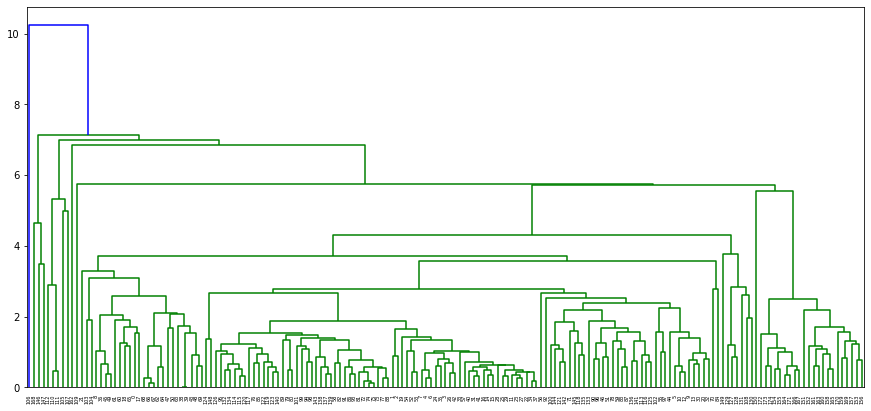

In [64]:
plt.figure(figsize=(15,7))
dendrogram(linkage(X, method='average'))
plt.show()

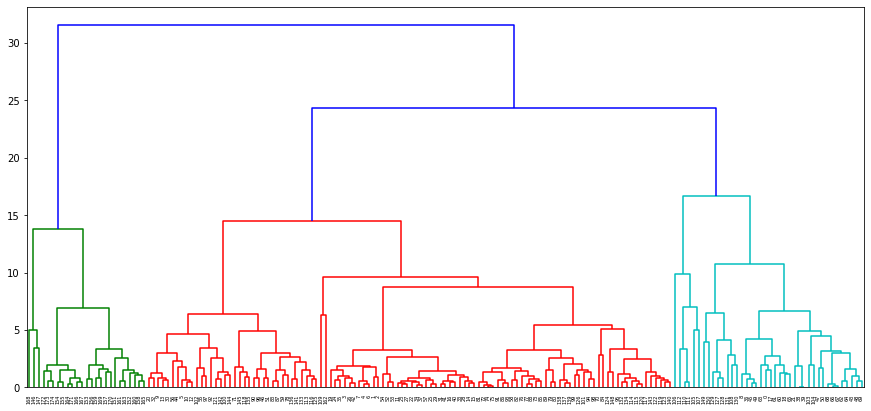

In [65]:
plt.figure(figsize=(15,7))
dendrogram(linkage(X, method='ward'))
plt.show()

In [66]:
Y.value_counts()

2    76
1    70
3    29
Name: Type, dtype: int64

### At k=3, the ward linkage produces the best results according to the dendogram.  Run the model to check which is the best for hierarchical clustering.

In [67]:
from sklearn.cluster import AgglomerativeClustering

In [68]:
k=3

In [69]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=k)

# Fit model
clusters = agg_cluster.fit_predict(X)

In [70]:
print('Linkage: complete / affinity: cosine')
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(Y, clusters)))
#print("The euclidean silhoutte score of the Agglomerative Clustering solution: {}"
#      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X, clusters, metric='cosine')))

Linkage: complete / affinity: cosine
Adjusted Rand Index of the Agglomerative Clustering solution: 0.2706301700454495
The silhouette score of the Agglomerative Clustering solution: 0.43899937658415766


In [71]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='average', 
                                      affinity='cosine',
                                      n_clusters=k)

# Fit model
clusters = agg_cluster.fit_predict(X)

In [72]:
print('Linkage: average')
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(Y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X, clusters, metric='cosine')))

Linkage: average
Adjusted Rand Index of the Agglomerative Clustering solution: 0.2425749427257319
The silhouette score of the Agglomerative Clustering solution: 0.43836121340491085


In [73]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=k)

# Fit model
clusters = agg_cluster.fit_predict(X)

In [74]:
print('Linkage: ward')
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(Y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X, clusters, metric='euclidean')))

Linkage: ward
Adjusted Rand Index of the Agglomerative Clustering solution: 0.2567637145779224
The silhouette score of the Agglomerative Clustering solution: 0.38396742923744237


### Hierarchical clustering with complete linkage gives the best results.  ARI=0.2568, silhouette = 0.3840.

### Better than k-means for ARI (0.2483), but worse for silhouette (0.4125).

## DBSCAN

In [75]:
from sklearn.cluster import DBSCAN

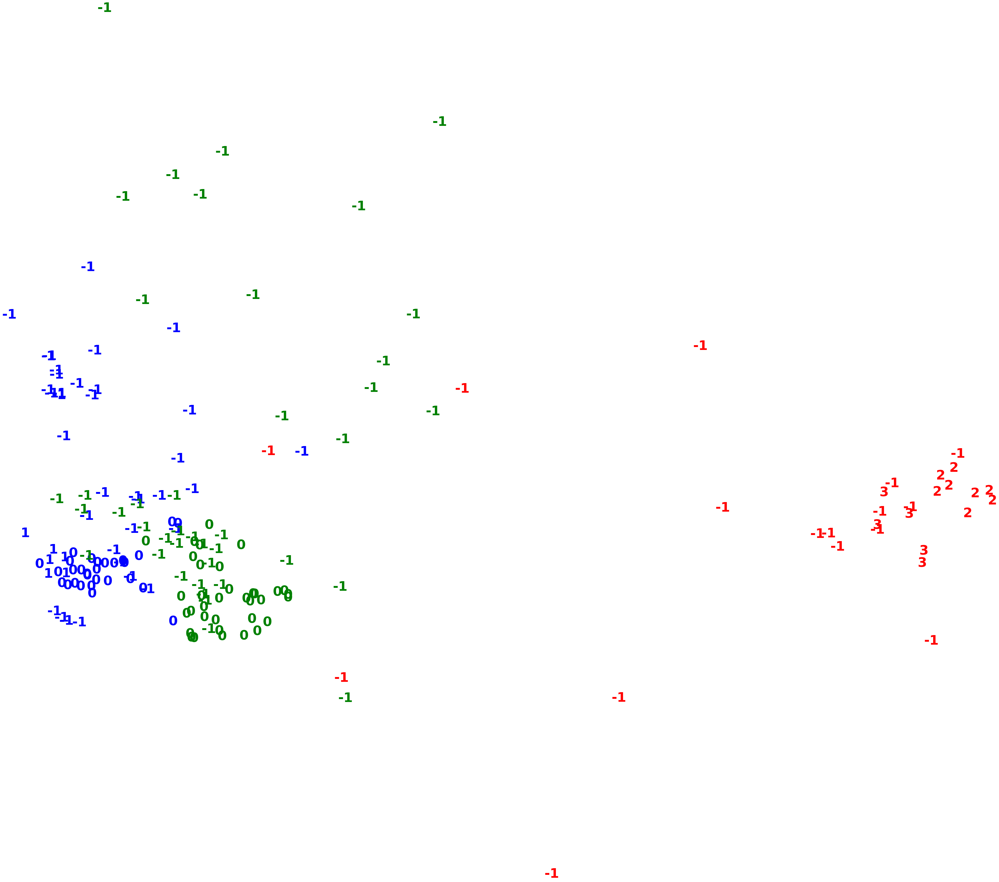

In [76]:
dbscan_cluster = DBSCAN(eps=1, min_samples=5, metric="euclidean")

# Fit model
predicted = dbscan_cluster.fit_predict(X)

pca = PCA(n_components=2).fit_transform(X)

plt.figure(figsize=(10,5))
colours = 'rbgrg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(predicted[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

with eps=1, get 3 clusters at min_samples=5 but most of data is now considered noise


In [77]:
print('eps=1, min_samples=5')
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(Y, predicted)))
#print("The euclidean silhoutte score of the Agglomerative Clustering solution: {}"
#      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X, predicted, metric='euclidean')))

eps=1, min_samples=5
Adjusted Rand Index of the Agglomerative Clustering solution: 0.07132695779791838
The silhoutte score of the Agglomerative Clustering solution: 0.033402709769671766


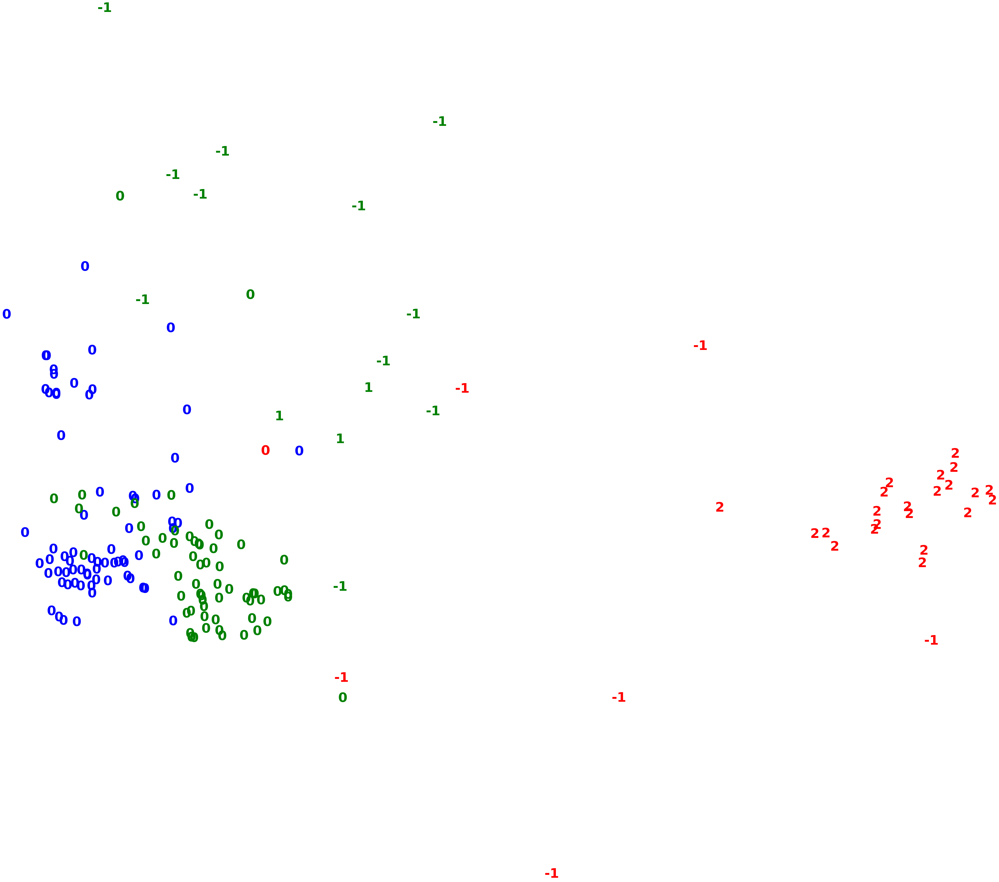

In [78]:
dbscan_cluster = DBSCAN(eps=2, min_samples=3, metric="euclidean")

# Fit model
predicted = dbscan_cluster.fit_predict(X)

pca = PCA(n_components=2).fit_transform(X)

plt.figure(figsize=(10,5))
colours = 'rbgrg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(predicted[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### with min_samples=3, eps=2 gives 3 clusters but it doesn't separate true classes 1&2

In [79]:
print('eps=2, min_samples=3')
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(Y, predicted)))
#print("The euclidean silhoutte score of the Agglomerative Clustering solution: {}"
#      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X, predicted, metric='euclidean')))

eps=2, min_samples=3
Adjusted Rand Index of the Agglomerative Clustering solution: 0.3004848597633176
The silhoutte score of the Agglomerative Clustering solution: 0.23238447119372316


## GMM

In [80]:
from sklearn.mixture import GaussianMixture

In [81]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=3, random_state=123, covariance_type="full")

# Fit model
clusters = gmm_cluster.fit_predict(X)

print("ARI score with covariance_type=full: {}".format(
    metrics.adjusted_rand_score(Y, clusters)))

print("Silhouette score with covariance_type=full: {}".format(
    metrics.silhouette_score(X, clusters, metric='euclidean')))
print("------------------------------------------------------")

# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=3, random_state=123, covariance_type="tied")

# Fit model
clusters = gmm_cluster.fit_predict(X)

print("ARI score with covariance_type=tied: {}".format(
    metrics.adjusted_rand_score(Y, clusters)))

print("Silhouette score with covariance_type=tied: {}".format(
    metrics.silhouette_score(X, clusters, metric='euclidean')))
print("------------------------------------------------------")

# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=3, random_state=123, covariance_type="diag")

# Fit model
clusters = gmm_cluster.fit_predict(X)

print("ARI score with covariance_type=diag: {}".format(
    metrics.adjusted_rand_score(Y, clusters)))

print("Silhouette score with covariance_type=diag: {}".format(
    metrics.silhouette_score(X, clusters, metric='euclidean')))
print("------------------------------------------------------")

ARI score with covariance_type=full: 0.23298590362764482
Silhouette score with covariance_type=full: 0.40751475981715257
------------------------------------------------------
ARI score with covariance_type=tied: 0.23626402650532935
Silhouette score with covariance_type=tied: 0.4244550162447459
------------------------------------------------------
ARI score with covariance_type=diag: 0.2052989057698189
Silhouette score with covariance_type=diag: 0.339778417577988
------------------------------------------------------


### GMM with a tied covariance gives the best scores: ARI=0.2363 and silhoette of 0.4245

### GMM has the highest silhouette score of all the models.

## Overall for this dataset, GMM gives the best silhouette score.

# 3. Final thoughts

Dimensionality reduction on this dataset suggests that two of the classes (1 & 2 in this case) are very difficult to separate out.

For the clustering algorithms the best silhouette score occurs with the number of clusters equal to 2.  This is indicative, similar to dimensionality reduction, that the models don't distinguish between classes 1 & 2 very well.

End of file